In [1]:
import os
import math
import dill
from itertools import permutations

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec
from sklearn.linear_model import LinearRegression as linreg

import suite2p as s2p

import TwoPUtils
import STX3KO_analyses as stx



%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
def common_rois(roi_matches,inds):
    
    
    ref =  roi_matches[inds[0]]
    ref_common_rois = []
    
    
    for i, targ_ind in enumerate(inds[1:]):
        
#         targ = roi_matches[targ_ind][inds[0]]
        if i==0:
            
            ref_common_rois = set(ref[targ_ind]['ref_inds']) 
        else: 
            ref_common_rois = ref_common_rois & set(ref[targ_ind]['ref_inds'])
        
        # find cells that are in reference match list each time
    ref_common_rois = list(ref_common_rois)

    # find matching indices
    common_roi_mapping = np.zeros([len(inds), len(ref_common_rois)])*np.nan
    common_roi_mapping[0,:]=ref_common_rois
    for i, roi in enumerate(ref_common_rois):
        for j, targ_ind in enumerate(inds[1:]):
#             print(j)
            ind = np.argwhere(ref[targ_ind]['ref_inds']==roi)[0][0]
#             print(j,roi,ind)
            common_roi_mapping[j+1,i] = ref[targ_ind]['targ_inds'][ind]

    return common_roi_mapping.astype(np.int)

    

In [3]:
class Concat_Session():
    
    def __init__(self,sess_list, common_roi_mapping, trial_info_keys = ['LR', 'block_number'], trial_mat_keys = ['F_dff'], 
                 timeseries_keys = [], run_place_cells = True, day_inds = None):
        attrs = self.concat(sess_list, common_roi_mapping, trial_info_keys, trial_mat_keys, 
                 timeseries_keys, run_place_cells,  day_inds)
        
        self.__dict__.update(attrs)
        trial_info_keys = []
    @staticmethod    
    def concat(_sess_list, common_roi_mapping, t_info_keys, t_mat_keys, 
                 timeseries_keys, run_place_cells,  day_inds):
        attrs = {}
        # same info
#         same_attrs = ['mouse', 'novel_arm','rzone_early', 'rzone_late']
        attrs.update({ 'mouse': _sess_list[0].mouse,
                      'novel_arm': _sess_list[0].novel_arm,
                      'rzone_early': _sess_list[0].rzone_early,
                      'rzone_late': _sess_list[0].rzone_late
                    })
        print(t_info_keys)
        
        # concat basic info 
        basic_info_attrs = ['date', 'scan', 'scan_info', 'scene', 'session', 'teleport_inds', 'trial_start_inds']
        attrs.update({k:[] for k in basic_info_attrs})

        if 'sess_num_ravel' not in t_info_keys:
            t_info_keys.append('sess_num_ravel')
        if 'sess_num' not in t_info_keys and day_inds is not None:
            t_info_keys.append('sess_num')
            
        trial_info = {k:[] for k in t_info_keys}

        trial_mat = {k:[] for k in t_mat_keys}
        trial_mat['bin_edges']=_sess_list[0].trial_matrices['bin_edges']
        trial_mat['bin_centers']=_sess_list[0].trial_matrices['bin_centers']

        timeseries = {k:[] for k in timeseries_keys}

        if run_place_cells:
            place_cells = {-1:{'masks':[], 'SI': [], 'p':[]}, 1: {'masks':[], 'SI': [], 'p':[]}}

        last_block = 0
        for ind, _sess in enumerate(_sess_list):

            for k in basic_info_attrs:
                attrs[k].append(getattr(_sess,k))

            for k in t_info_keys:

                if k == 'sess_num_ravel' :
                    trial_info[k].append(np.zeros([_sess.trial_info['LR'].shape[0],])+ind)
                elif k == 'sess_num' and day_inds is not None:
                    trial_info[k].append(np.zeros([_sess.trial_info['LR'].shape[0],])+day_inds[ind])
            
                elif k == 'block_number' and day_inds is not None and ind>0:
                    if _sess.trial_info[k][0]==0 and day_inds[ind-1]==day_inds[ind]:
                        trial_info[k].append(_sess.trial_info[k] + _sess_list[ind-1].trial_info[k][-1] +1)
                    else:
                        trial_info[k].append(_sess.trial_info[k])
                else:
                    trial_info[k].append(_sess.trial_info[k])

            for k in t_mat_keys:
                trial_mat[k].append(_sess.trial_matrices[k][:,:,common_roi_mapping[ind,:]])

            for k in timeseries_keys:
                timeseries[k].append(_sess.timeseries[k][:,:,common_roi_mapping[ind,:]])


            if run_place_cells:
                for lr, _lr in [[-1,'left'], [1, 'right']]:
                    for k in ['masks', 'SI', 'p']:
                        place_cells[lr][k].append(_sess.place_cell_info[_lr][k][common_roi_mapping[ind,:]])

        print(t_info_keys)
        for k in t_info_keys:
            print(k)
            trial_info[k]= np.concatenate(trial_info[k])
        attrs['trial_info']=trial_info

        for k in t_mat_keys:
            trial_mat[k] = np.concatenate(trial_mat[k],axis=0)
        attrs['trial_matrices']=trial_mat
        
        if run_place_cells:
            for lr in [-1, 1]:
                    for k in ['masks', 'SI', 'p']:
                        place_cells[lr][k] = np.array(place_cells[lr][k])
        attrs['place_cell_info'] = place_cells
        
        return attrs
        
        
        
        
    
    
    
    
    
    
    
    

In [4]:
def single_mouse_concat_sessions(mouse,date_inds=None):
    pkldir = os.path.join('/home/mplitt/YMazeSessPkls/',mouse)

    with open(os.path.join(pkldir,"roi_aligner_results.pkl"),'rb') as file:
        match_inds = dill.load(file)

    if mouse in stx.ymaze_sess_deets.KO_sessions.keys():  
        sessions_deets = stx.ymaze_sess_deets.KO_sessions[mouse]
    elif mouse in stx.ymaze_sess_deets.CTRL_sessions.keys():
        sessions_deets = stx.ymaze_sess_deets.CTRL_sessions[mouse]
    else:
        print( "mouse ID typo")
        
    
    if date_inds is None:
        date_inds = np.arange(len(sessions_deets)).tolist()
    
    date_inds_ravel = []
    sess_list = []
    for date_ind in date_inds:
        deets = sessions_deets[date_ind]
        if isinstance(deets, tuple):
            _sess_list = []
            for _deets in deets:
                sess = stx.session.YMazeSession.from_file(
                                    os.path.join(pkldir, _deets['date'], "%s_%d.pkl" % (_deets['scene'], _deets['session'])),
                                    verbose=False)
                sess.add_timeseries(licks=sess.vr_data['lick']._values)
                sess.add_pos_binned_trial_matrix('licks')
                sess.novel_arm = _deets['novel']
    #             _sess_list.append(sess)
                print(_deets['date'],_deets['scene'])
                sess_list.append(sess)
                date_inds_ravel.append(date_ind)
        else:
            sess = stx.session.YMazeSession.from_file(
                                    os.path.join(pkldir, deets['date'], "%s_%d.pkl" % (deets['scene'], deets['session'])),
                                    verbose=False)
            sess.add_timeseries(licks=sess.vr_data['lick']._values)
            sess.add_pos_binned_trial_matrix('licks')
            sess.novel_arm = deets['novel']
            sess_list.append(sess)
            date_inds_ravel.append(date_ind)
            print(deets['date'],deets['scene'])


    common_roi_mapping = common_rois(match_inds, [i for i in range(len(sess_list))])
    concat_sess = Concat_Session(sess_list,common_roi_mapping, day_inds = date_inds_ravel)
    return concat_sess
        

In [5]:
# for mice in (stx.ymaze_sess_deets.KO_sessions.keys()): #, stx.ymaze_sess_deets.CTRL_sessions.keys()):
# print(mice)
def plot_crossval_placecells(mice, max_sess = 6):
    fam_dict, nov_dict = {d: {d: [] for d in range(max_sess)} for d in range(max_sess)}, {d: {d: [] for d in range(max_sess)} for d in range(max_sess)}
    fam_sort_dict, nov_sort_dict = {d: [] for d in range(max_sess)}, {d: [] for d in range(max_sess)}
    fam_mu_dict, nov_mu_dict = {d: [] for d in range(max_sess)}, {d: [] for d in range(max_sess)}
    fam_std_dict, nov_std_dict = {d: [] for d in range(max_sess)}, {d: [] for d in range(max_sess)}
    for mouse in mice:
        concat_sess = single_mouse_concat_sessions(mouse,date_inds=np.arange(0,max_sess))
        for sort_day in range(max_sess):
            place_cell_mask = np.ones([concat_sess.trial_matrices['F_dff'].shape[-1],])>0 #concat_sess.place_cell_info[-1*concat_sess.novel_arm]['masks'][sort_day,:]
            
            trial_mask = (concat_sess.trial_info['sess_num']==sort_day)*(concat_sess.trial_info['LR']==-1*concat_sess.novel_arm)
            trial_inds = np.arange(trial_mask.shape[0])
            trial_inds = trial_inds[trial_mask]
            fr = np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds[::2],:,:],axis=0)
            fam_mu, fam_std = fr.mean(axis=0,keepdims=True), fr.std(axis=0,keepdims=True)
            fam_mu_dict[sort_day].append(fam_mu)
            fam_std_dict[sort_day].append(fam_std)
            
            trial_mask = (concat_sess.trial_info['sess_num']==sort_day)*(concat_sess.trial_info['LR']==concat_sess.novel_arm)
            trial_inds = np.arange(trial_mask.shape[0])
            trial_inds = trial_inds[trial_mask]
            fr = np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds[::2],:,:],axis=0)
            nov_mu, nov_std = fr.mean(axis=0,keepdims=True), fr.std(axis=0,keepdims=True)
            nov_mu_dict[sort_day].append(nov_mu)
            nov_std_dict[sort_day].append(nov_std)
            
            for day in range(max_sess):
                trial_mask = (concat_sess.trial_info['sess_num']==day)*(concat_sess.trial_info['LR']==-1*concat_sess.novel_arm)
                trial_inds = np.arange(trial_mask.shape[0])
                trial_inds = trial_inds[trial_mask]
                if sort_day==day:
                    fam_sort_dict[sort_day].append(sp.stats.zscore(np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds[::2],:,:],axis=0)[:,place_cell_mask],axis=1))
                    trial_inds = trial_inds[1::2]
#                 fr = sp.stats.zscore(np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds,:,:],axis=0)[:,place_cell_mask],axis=1)
                fr = np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds,:,:],axis=0)
                fam_dict[sort_day][day].append(fr)
                
                trial_mask = (concat_sess.trial_info['sess_num']==day)*(concat_sess.trial_info['LR']==concat_sess.novel_arm)
                trial_inds = np.arange(trial_mask.shape[0])
                trial_inds = trial_inds[trial_mask]
                if sort_day==day:
                    nov_sort_dict[sort_day].append(sp.stats.zscore(np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds[::2],:,:],axis=0)[:,place_cell_mask],axis=1))
                    trial_inds = trial_inds[1::2]
                fr = np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds,:,:],axis=0)
                nov_dict[sort_day][day].append(fr)

    for sort_day in range(max_sess):
        fam_sort_dict[sort_day] = np.concatenate(fam_sort_dict[sort_day],axis = -1)
        nov_sort_dict[sort_day] = np.concatenate(nov_sort_dict[sort_day],axis = -1)
        
        fam_mu_dict[sort_day] = np.concatenate(fam_mu_dict[sort_day],axis = -1)
        nov_mu_dict[sort_day] = np.concatenate(nov_mu_dict[sort_day],axis = -1)
        
        fam_std_dict[sort_day] = np.concatenate(fam_std_dict[sort_day],axis = -1)
        nov_std_dict[sort_day] = np.concatenate(nov_std_dict[sort_day],axis = -1)
        
        for day in range(max_sess):
            fam_dict[sort_day][day] = np.concatenate(fam_dict[sort_day][day],axis = -1)
            nov_dict[sort_day][day] = np.concatenate(nov_dict[sort_day][day],axis = -1)

    fig_fam_fam, ax_fam_fam  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_fam_fam.suptitle('Familiar act, Familiar sort')
    
    fig_fam_nov, ax_fam_nov  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_fam_nov.suptitle('Familiar act, Novel sort')
    
    fig_nov_fam, ax_nov_fam  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_nov_fam.suptitle('Novel act, Familiar sort')
    
    fig_nov_nov, ax_nov_nov  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_nov_nov.suptitle('Novel act, Novel sort')
    for sort_day in range(max_sess):
        sort_fam  = np.argsort(np.argmax(fam_sort_dict[sort_day],axis=0))
        sort_nov  = np.argsort(np.argmax(nov_sort_dict[sort_day],axis=0))
        for day in range(max_sess):
            fam_fam = (fam_dict[sort_day][day]-fam_mu_dict[sort_day])/fam_std_dict[sort_day]
            fam_nov = (fam_dict[sort_day][day] - nov_mu_dict[sort_day])/nov_std_dict[sort_day]
            nov_fam = (nov_dict[sort_day][day] - fam_mu_dict[sort_day])/fam_std_dict[sort_day]
            nov_nov = (nov_dict[sort_day][day] - nov_mu_dict[sort_day])/nov_std_dict[sort_day]
            
#             ax_fam_fam[sort_day, day].imshow(fam_dict[sort_day][day][:,sort_fam].T, aspect = 'auto', vmax = 3, vmin  =0., cmap = 'pink')
            ax_fam_fam[sort_day, day].imshow(fam_fam[:,sort_fam].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            
#             ax_fam_nov[sort_day, day].imshow(fam_dict[sort_day][day][:,sort_nov].T, aspect = 'auto', vmax = 3, vmin  =0., cmap = 'pink')
            ax_fam_nov[sort_day, day].imshow(fam_nov[:,sort_nov].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            
#             ax_nov_fam[sort_day, day].imshow(nov_dict[sort_day][day][:,sort_fam].T, aspect = 'auto', vmax = 3, vmin  =0., cmap = 'pink')
            ax_nov_fam[sort_day, day].imshow(nov_fam[:,sort_fam].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            
#             ax_nov_nov[sort_day, day].imshow(nov_dict[sort_day][day][:,sort_nov].T, aspect = 'auto', vmax = 3, vmin  =0., cmap = 'pink')
            ax_nov_nov[sort_day, day].imshow(nov_nov[:,sort_nov].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            
            
    return (fig_fam_fam, ax_fam_fam), (fig_fam_nov, ax_fam_nov), (fig_nov_fam, ax_nov_fam), (fig_nov_nov, ax_nov_nov)

In [40]:
figdir = "/mnt/BigDisk/YMazeResults"

28_09_2020 YMaze_LNovel
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020

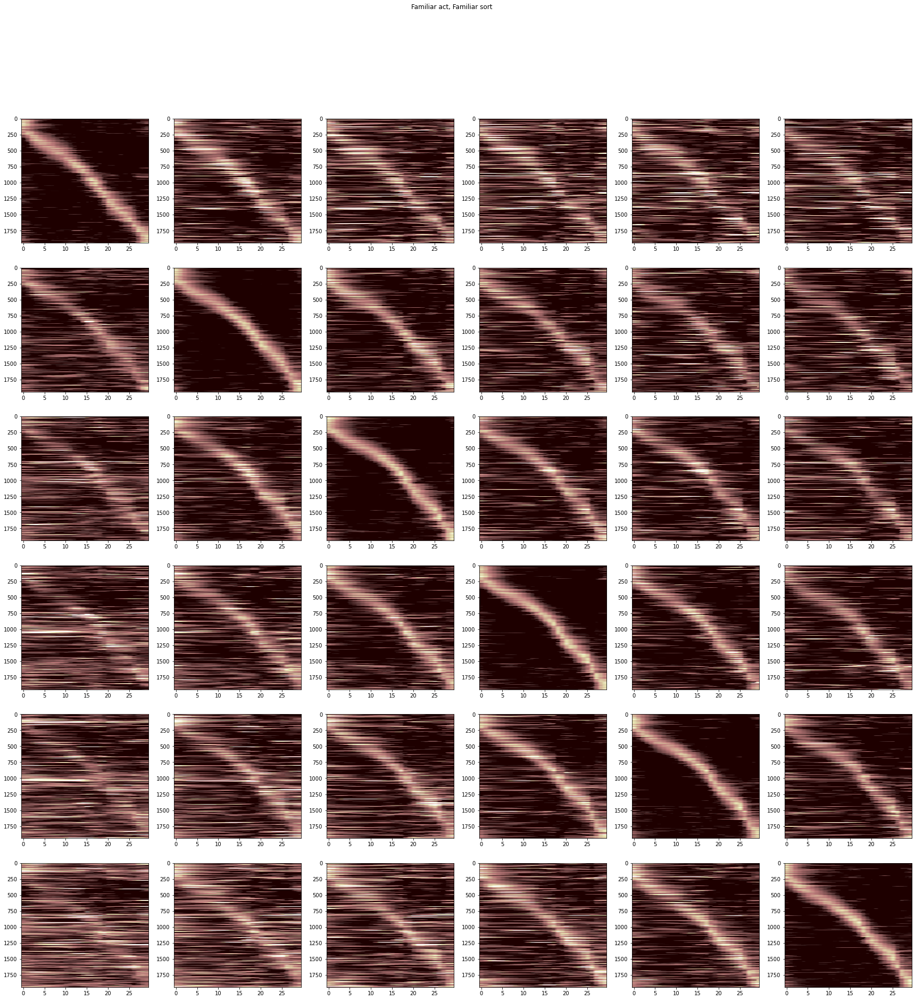

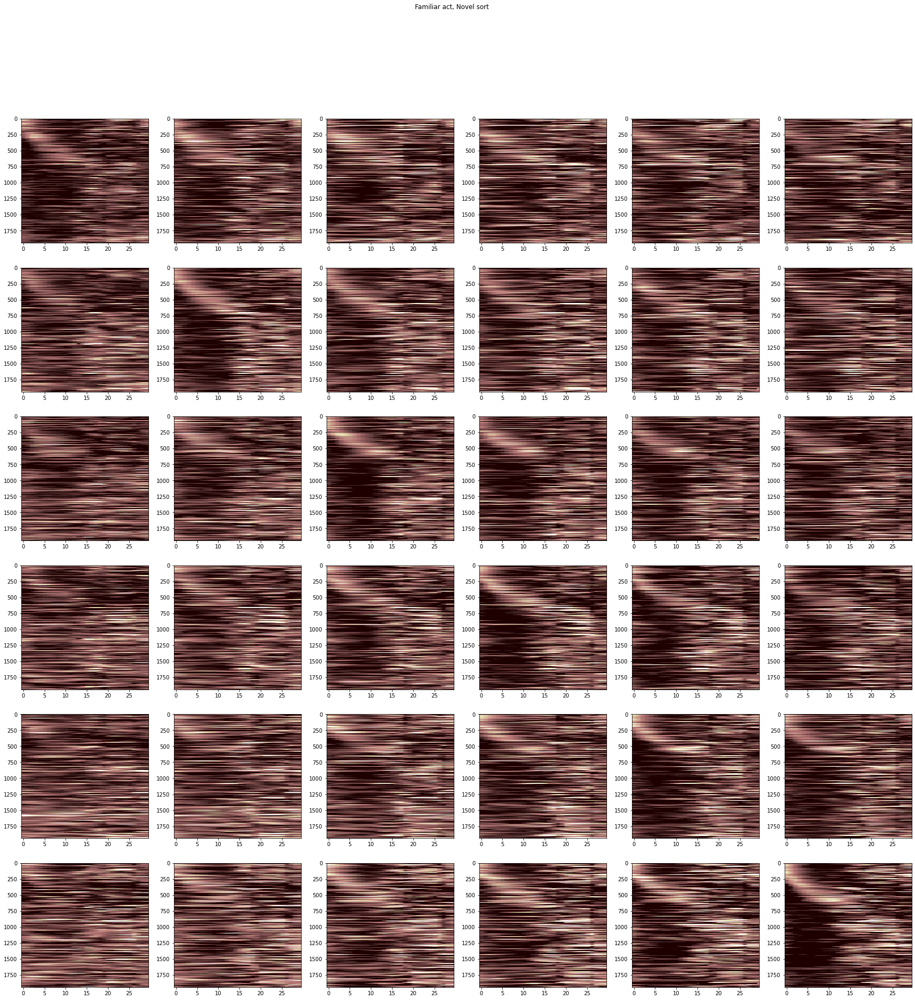

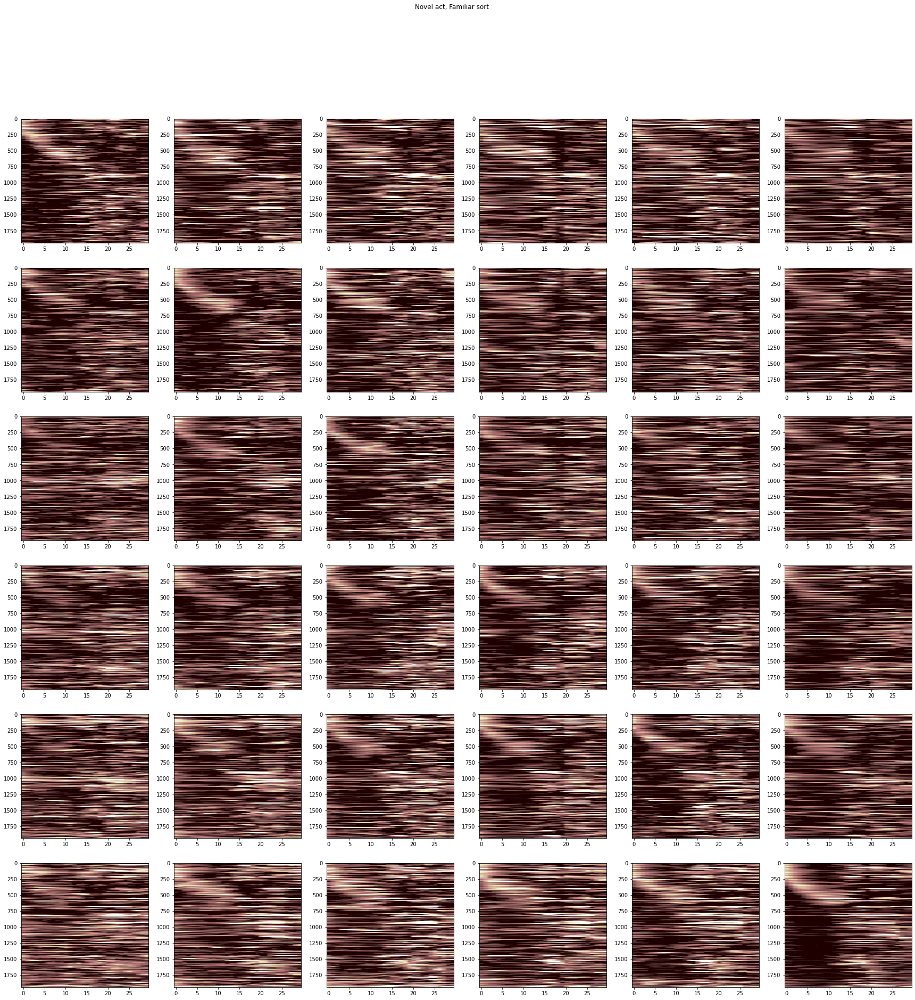

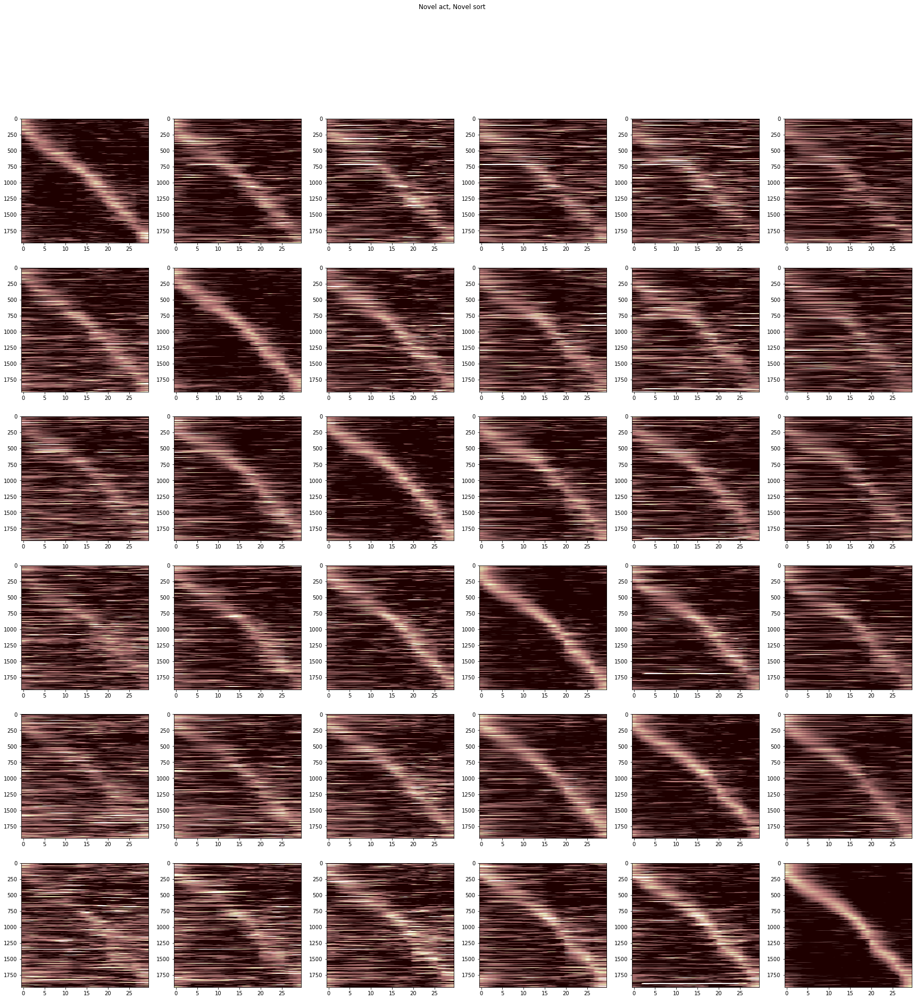

In [41]:
ff, fn, nf, nn = plot_crossval_placecells(stx.ymaze_sess_deets.KO_sessions.keys(), max_sess=6)
ff[0].savefig(os.path.join(figdir,"KO_PlaceCells_FamAct_FamSort.pdf"), format = "pdf")
fn[0].savefig(os.path.join(figdir,"KO_PlaceCells_FamAct_NovSort.pdf"), format = "pdf")
nf[0].savefig(os.path.join(figdir,"KO_PlaceCells_NovAct_FamSort.pdf"), format = "pdf")
nn[0].savefig(os.path.join(figdir,"KO_PlaceCells_NovAct_NovSort.pdf"), format = "pdf")

29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
29_11_2020 YMaze_LNovel
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020

/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:95: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")


05_12_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num


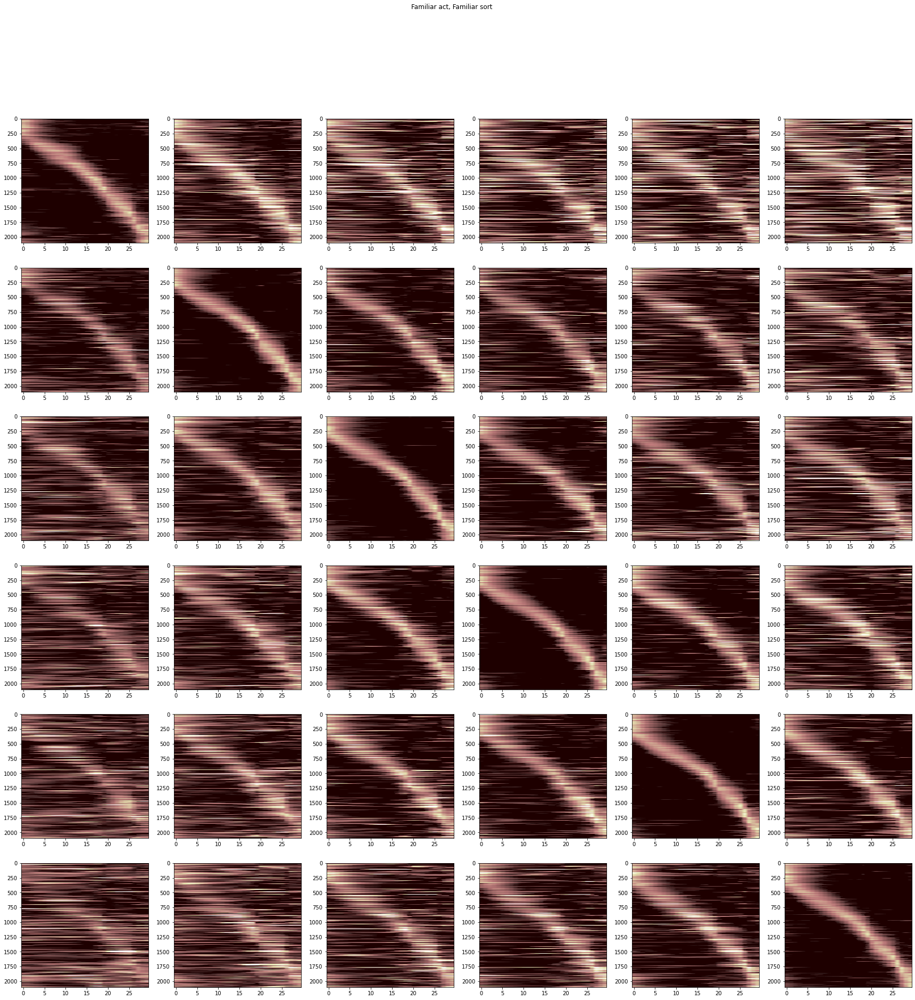

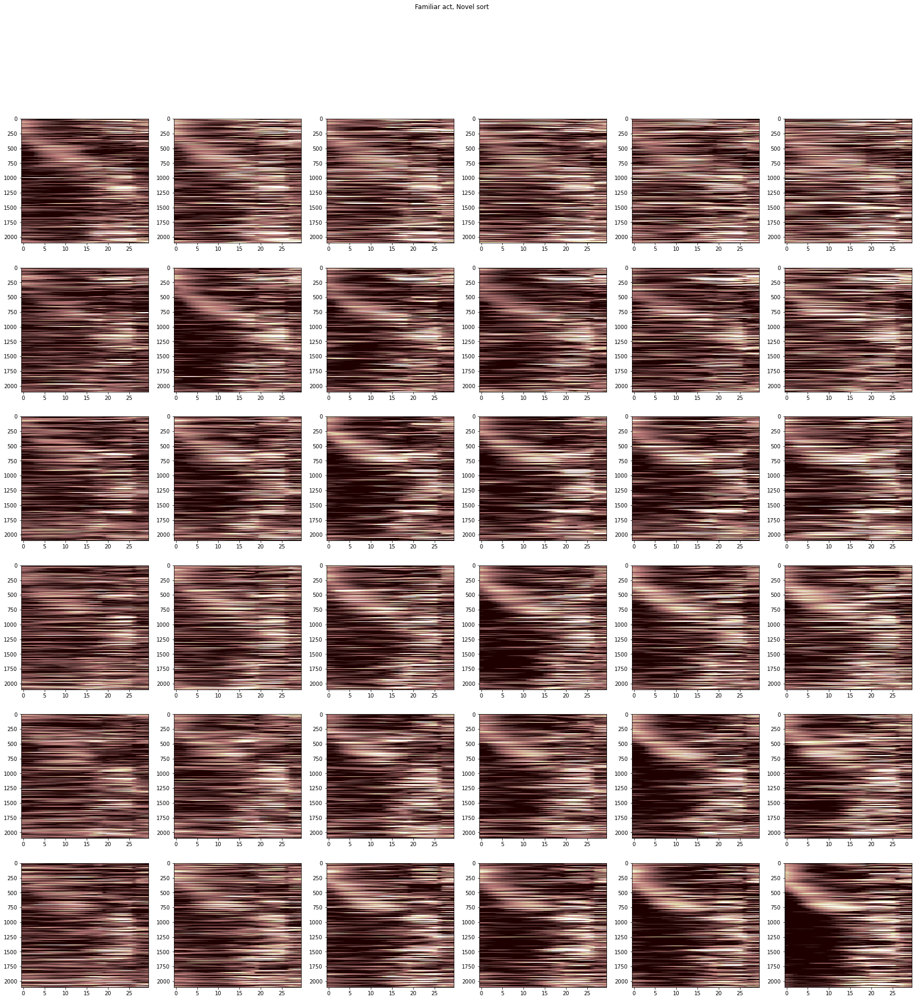

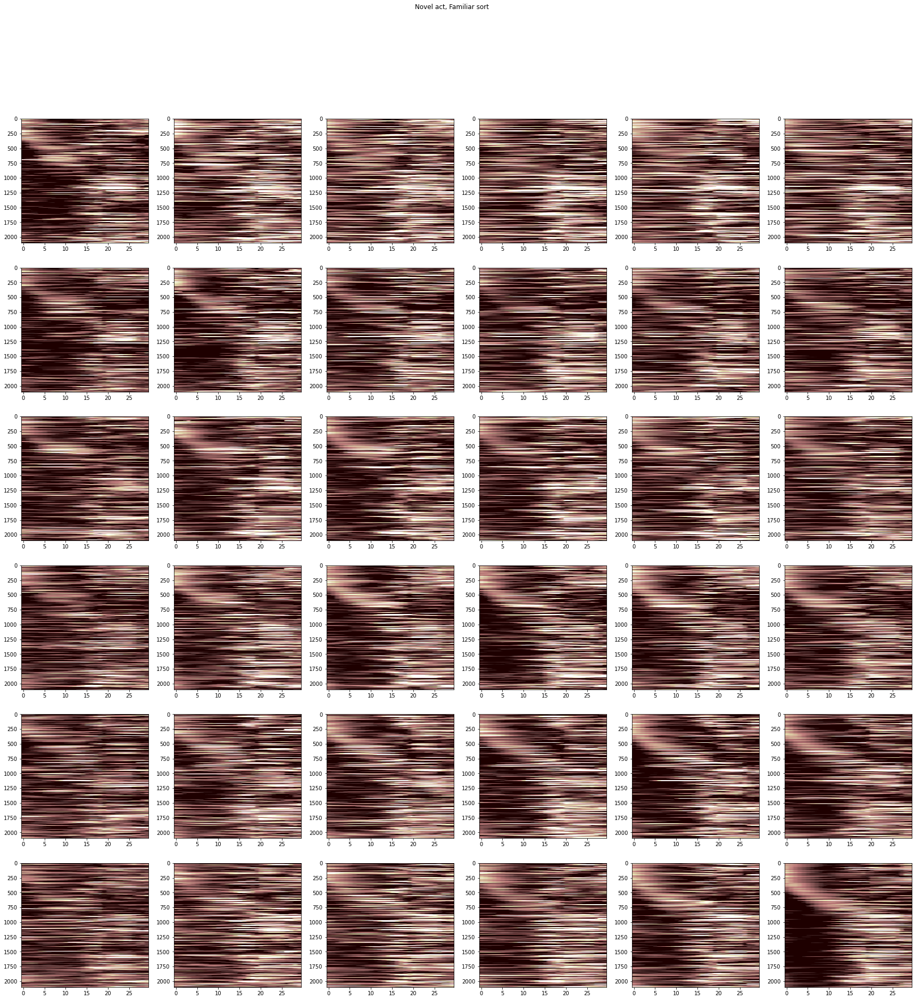

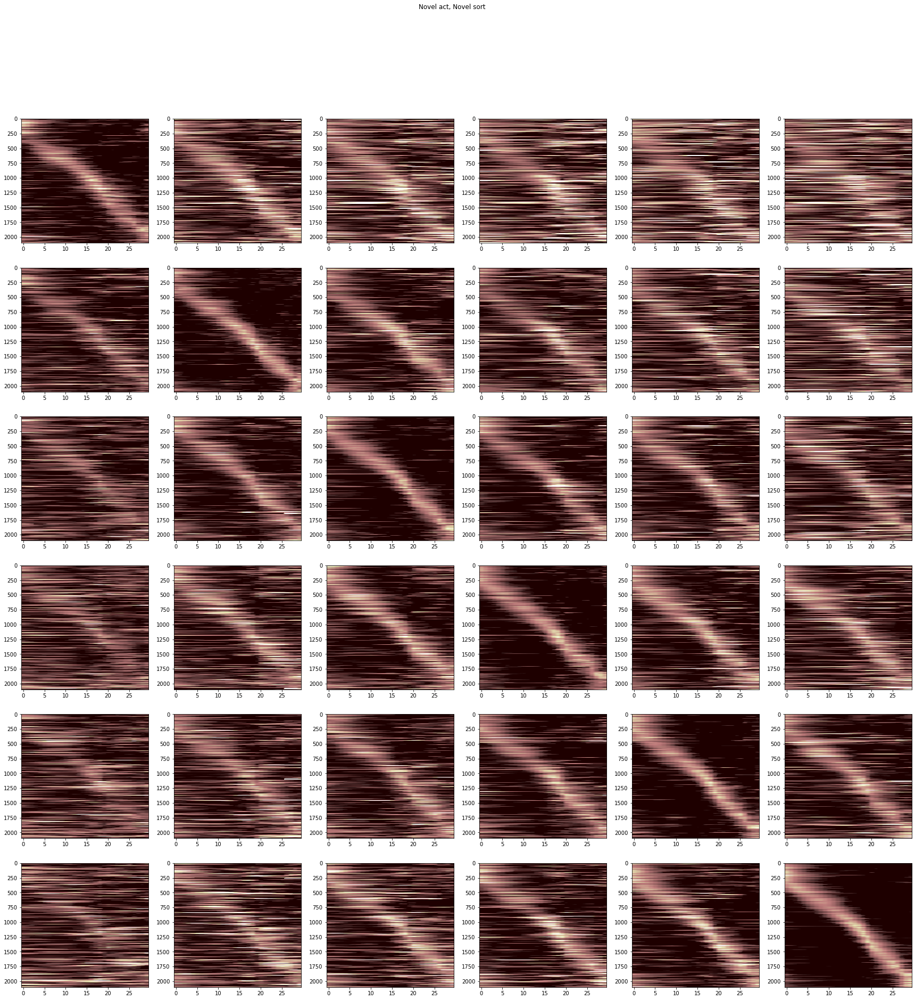

In [42]:
ff, fn, nf, nn = plot_crossval_placecells(stx.ymaze_sess_deets.CTRL_sessions.keys(),max_sess=6)
ff[0].savefig(os.path.join(figdir,"CTRL_PlaceCells_FamAct_FamSort.pdf"), format = "pdf")
fn[0].savefig(os.path.join(figdir,"CTRL_PlaceCells_FamAct_NovSort.pdf"), format = "pdf")
nf[0].savefig(os.path.join(figdir,"CTRL_PlaceCells_NovAct_FamSort.pdf"), format = "pdf")
nn[0].savefig(os.path.join(figdir,"CTRL_PlaceCells_NovAct_NovSort.pdf"), format = "pdf")

In [112]:
print(np.arange(0,10)[1::2])

[1 3 5 7 9]


28_09_2020 YMaze_LNovel
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020

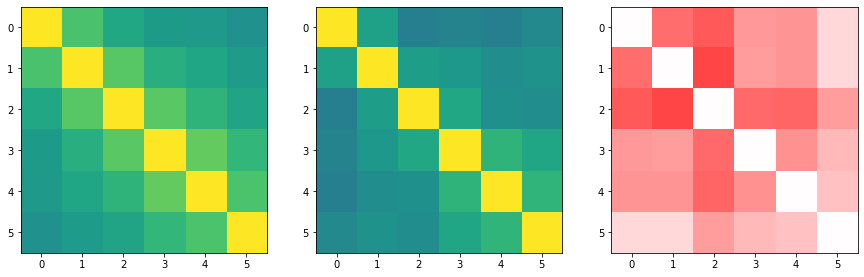

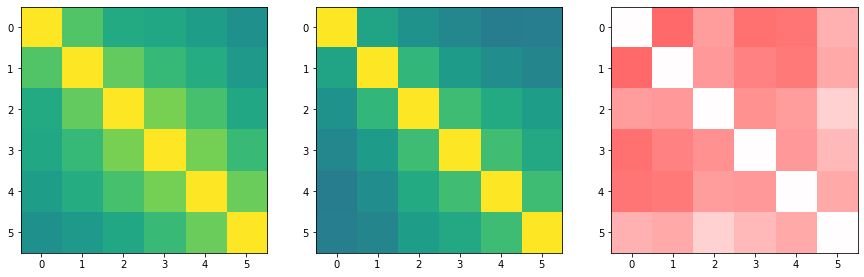

In [113]:
# day by day correlation 
def crossday_corr(mice):
    fam_fr, nov_fr = [], []
    for mouse in mice:
        concat_sess = single_mouse_concat_sessions(mouse,date_inds=np.arange(0,6))
        _fam_fr = np.zeros([6, *concat_sess.trial_matrices['F_dff'].shape[1:]])
        _nov_fr = np.zeros([6, *concat_sess.trial_matrices['F_dff'].shape[1:]])
        for day in range(6):
            trial_mask = (concat_sess.trial_info['sess_num']==day)*(concat_sess.trial_info['LR']==-1*concat_sess.novel_arm)
            _fam_fr[day,:,:] = np.nanmean(concat_sess.trial_matrices['F_dff'][trial_mask,:,:],axis=0)
            trial_mask = (concat_sess.trial_info['sess_num']==day)*(concat_sess.trial_info['LR']==concat_sess.novel_arm)
            _nov_fr[day,:,:] = np.nanmean(concat_sess.trial_matrices['F_dff'][trial_mask,:,:],axis=0)
    
        fam_fr.append(_fam_fr)
        nov_fr.append(_nov_fr)
        
    fam_sm, nov_sm = [], []
    for i in range(len(fam_fr)):
        _fr = np.transpose(fam_fr[i],axes = (2,0,1))
        _fr_norm = _fr/np.linalg.norm(_fr,ord=2,axis=2,keepdims=True)
        _fam_sm = np.matmul(_fr_norm, np.transpose(_fr_norm,axes=(0,2,1)))
        fam_sm.append(_fam_sm.mean(axis=0))
        
        _fr = np.transpose(nov_fr[i],axes = (2,0,1))
        _fr_norm = _fr/np.linalg.norm(_fr,ord=2,axis=2,keepdims=True)
        _nov_sm = np.matmul(_fr_norm, np.transpose(_fr_norm,axes=(0,2,1)))
        nov_sm.append(_nov_sm.mean(axis=0))

    fam_sm, nov_sm = np.array(fam_sm), np.array(nov_sm)
    fig,ax = plt.subplots(1,3, figsize=[15,5])

    ax[0].imshow(fam_sm.mean(axis=0), vmax = 1, vmin=.6)
    ax[1].imshow(nov_sm.mean(axis=0), vmax = 1, vmin=.6)
    print(fam_sm.mean(axis=0))
    print(nov_sm.mean(axis=0))
    ax[2].imshow(fam_sm.mean(axis=0)-nov_sm.mean(axis=0), vmin=-.2, vmax=.2, cmap='seismic')

    
    return {'fam_fr': fam_fr, 
            'nov_fr': nov_fr, 
            'fam_sm': fam_sm,
            'nov_sm': nov_sm}

ko_fr = crossday_corr(stx.ymaze_sess_deets.KO_sessions.keys())
ctrl_fr = crossday_corr(stx.ymaze_sess_deets.CTRL_sessions.keys())






[[       nan 0.72785415 0.72358345 0.26232107 0.64778933 0.94713642]
 [0.72785415        nan 0.54413185 0.37684482 0.55001981 0.87862099]
 [0.72358345 0.54413185        nan 0.09446686 0.15192705 0.6833962 ]
 [0.26232107 0.37684482 0.09446686        nan 0.32108523 0.74531524]
 [0.64778933 0.55001981 0.15192705 0.32108523        nan 0.12284012]
 [0.94713642 0.87862099 0.6833962  0.74531524 0.12284012        nan]]
[[       nan 0.85106704 0.21677182 0.81960995 0.88180498 0.40940857]
 [0.85106704        nan 0.26456417 0.84471824 0.9966239  0.42177032]
 [0.21677182 0.26456417        nan 0.17683544 0.12876476 0.18790207]
 [0.81960995 0.84471824 0.17683544        nan 0.39617244 0.79693312]
 [0.88180498 0.9966239  0.12876476 0.39617244        nan 0.38508681]
 [0.40940857 0.42177032 0.18790207 0.79693312 0.38508681        nan]]


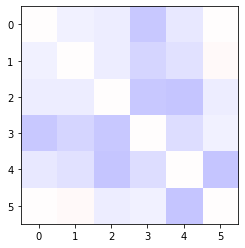

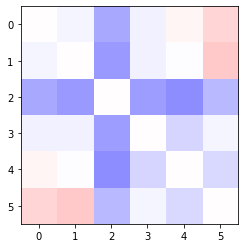

In [114]:
# KO vs control

fig, ax = plt.subplots()
ax.imshow(ko_fr['fam_sm'].mean(axis=0) - ctrl_fr['fam_sm'].mean(axis=0),vmin = -.2, vmax = .2, cmap='seismic')

fig, ax = plt.subplots()
ax.imshow(ko_fr['nov_sm'].mean(axis=0) - ctrl_fr['nov_sm'].mean(axis=0),vmin = -.2, vmax = .2, cmap='seismic')

# check on what's going on with day 4, make sure there's nothing weird driving the result
t,p = sp.stats.ttest_ind(ko_fr['fam_sm'], ctrl_fr['fam_sm'],axis=0)
print(p)

t,p = sp.stats.ttest_ind(ko_fr['nov_sm'], ctrl_fr['nov_sm'],axis=0)
print(p)


In [ ]:
# look at distributions of day to day correlations 



In [31]:
# day 1 remapping

def load_single_day(mouse, day = 0):

#     mouse = '4467331.2'
    pkldir = os.path.join('/home/mplitt/YMazeSessPkls/',mouse)
    if mouse in stx.ymaze_sess_deets.KO_sessions.keys():
        
        deets = stx.ymaze_sess_deets.KO_sessions[mouse][day]
    elif mouse in stx.ymaze_sess_deets.CTRL_sessions.keys():
        deets = stx.ymaze_sess_deets.CTRL_sessions[mouse][day]
    else:
        raise Exception("invalid mouse name")


    print(deets)
    if isinstance(deets,tuple):
        with open(os.path.join(pkldir,"roi_aligner_results.pkl"),'rb') as file:
            match_inds = dill.load(file)
        
        
        common_roi_mapping = common_rois(match_inds, [d['ravel_ind'] for d in deets])
        sess_list = []
        for _deets in deets:
            _sess = stx.session.YMazeSession.from_file(
                                os.path.join(pkldir, _deets['date'], "%s_%d.pkl" % (_deets['scene'], _deets['session'])),
                                verbose=False)
            _sess.add_timeseries(licks=_sess.vr_data['lick']._values)
            _sess.add_pos_binned_trial_matrix('licks')
            _sess.novel_arm = _deets['novel']
    #             _sess_list.append(sess)
            print(_deets['date'],_deets['scene'])
            sess_list.append(_sess)


        sess = Concat_Session(sess_list,common_roi_mapping, day_inds = [0 for i in range(len(deets))])
        if mouse in ['4467332.2'] and day ==0:
            mask = sess.trial_info['sess_num_ravel']>0
            sess.trial_info['block_number'][mask] -= 1
    else:
        sess = stx.session.YMazeSession.from_file(
                                os.path.join(pkldir, deets['date'], "%s_%d.pkl" % (deets['scene'], deets['session'])),
                                verbose=False)
        sess.add_timeseries(licks=sess.vr_data['lick']._values)
        sess.add_pos_binned_trial_matrix('licks')
        sess.novel_arm = deets['novel']
    return sess

def sim_to_baseline_blocks(sess):
    trial_num = np.arange(0,sess.trial_info['block_number'].shape[0])
    stem_mask = np.array(sess.trial_matrices['bin_edges'][:-1])<sess.rzone_early['tfront']
    # look at stem vs arm 
    
    baseline_mask = (sess.trial_info['block_number']<5)
    
    
    
    first_test_trial = baseline_mask.sum()
    test_fam_mask = (sess.trial_info['block_number']==5)*(sess.trial_info['LR']==-1*sess.novel_arm)
    test_nov_mask = (sess.trial_info['block_number']==5)*(sess.trial_info['LR']==sess.novel_arm)
    
    sess.trial_matrices['F_dff'][np.isnan(sess.trial_matrices['F_dff'])]=0
    
    fam_sim, nov_sim, baseline_stab = [], [], []
    for stem in [stem_mask, ~stem_mask]:
        
        # loop through baseline trials and calculate similarity of each trial to average (excluding that trial)
        
        trials = sp.ndimage.filters.gaussian_filter1d(sess.trial_matrices['F_dff'], 1, axis=1)[:,stem,:]
        trials_flat = np.reshape(trials,[trials.shape[0],-1])
        trials_flat_norm = trials_flat/np.linalg.norm(trials_flat, ord=2, axis=-1, keepdims=True) + 1E-3
        
        cv_avg_baseline_flat = np.zeros([baseline_mask.sum(),trials_flat.shape[-1]])
        for i, trial in enumerate(trial_num[baseline_mask].tolist()):
            tmp_baseline_mask = np.copy(baseline_mask)
            tmp_baseline_mask[trial]=False
            cv_avg_baseline_flat[i,:] = np.nanmean(trials_flat[tmp_baseline_mask,:],axis=0)
        
        cv_avg_baseline_flat /= np.linalg.norm(cv_avg_baseline_flat,ord=2,axis=1, keepdims=True) + 1E-3
        baseline_stab.append(np.diag(np.matmul(cv_avg_baseline_flat, trials_flat_norm[baseline_mask,:].T)))
            
        

        avg_baseline_flat = np.nanmean(trials_flat[baseline_mask,:], axis=0, keepdims = True)
        avg_baseline_flat /= np.linalg.norm(avg_baseline_flat,ord=2,axis=-1,keepdims=True) + 1E-3

        

#         test_fam = sess.trial_matrices['F_dff'][test_fam_mask,:,:]
#         test_fam_flat = np.reshape(test_fam[:,stem,:],[test_fam_mask.sum(),-1])
        test_fam_flat = trials_flat[test_fam_mask,:]
        test_fam_flat /= np.linalg.norm(test_fam_flat, ord=2, axis=-1, keepdims=True) + 1E-3


#         test_nov = sess.trial_matrices['F_dff'][test_nov_mask,:,:]
#         test_nov_flat = np.reshape(test_nov[:,stem,:],[test_nov_mask.sum(),-1])
        test_nov_flat = trials_flat[test_nov_mask,:]
        test_nov_flat /= np.linalg.norm(test_nov_flat, ord=2, axis=-1, keepdims=True) + 1E-3


        fam_sim.append(np.matmul(test_fam_flat,avg_baseline_flat.T).ravel())
        nov_sim.append(np.matmul(test_nov_flat,avg_baseline_flat.T).ravel())
    
    fam_trials = trial_num[test_fam_mask]-first_test_trial
    nov_trials = trial_num[test_nov_mask] - first_test_trial
    
    return {'fam_sim':fam_sim, 
            'nov_sim':nov_sim, 
            'fam_trials': fam_trials, 
            'nov_trials': nov_trials,
            'baseline_stab': baseline_stab}



def avg_sim_to_baseline_blocks(sess):
    trial_num = np.arange(0,sess.trial_info['block_number'].shape[0])
    stem_mask = np.array(sess.trial_matrices['bin_edges'][:-1])<sess.rzone_early['tfront']
    # look at stem vs arm 
    
    baseline_mask = (sess.trial_info['block_number']<5)
    
    
    
    first_test_trial = baseline_mask.sum()
    test_fam_mask = (sess.trial_info['block_number']==5)*(sess.trial_info['LR']==-1*sess.novel_arm)
    test_nov_mask = (sess.trial_info['block_number']==5)*(sess.trial_info['LR']==sess.novel_arm)
    
    sess.trial_matrices['F_dff'][np.isnan(sess.trial_matrices['F_dff'])]=0
    
    fam_sim, nov_sim = [], []
    for stem in [stem_mask, ~stem_mask]:
        
        # loop through baseline trials and calculate similarity of each trial to average (excluding that trial)
        
        trials = sp.ndimage.filters.gaussian_filter1d(sess.trial_matrices['F_dff'], 1, axis=1)[:,stem,:]
        trials_flat = np.reshape(trials,[trials.shape[0],-1])
        
        

        avg_baseline_flat = np.nanmean(trials_flat[baseline_mask,:], axis=0)
        avg_baseline_flat /= np.linalg.norm(avg_baseline_flat,ord=2) + 1E-3

        
        test_fam_flat = np.nanmean(trials_flat[test_fam_mask,:],axis=0)
        test_fam_flat /= np.linalg.norm(test_fam_flat, ord=2) + 1E-3


        test_nov_flat = np.nanmean(trials_flat[test_nov_mask,:],axis=0)
        test_nov_flat /= np.linalg.norm(test_nov_flat, ord=2) + 1E-3


        fam_sim.append(np.dot(test_fam_flat,avg_baseline_flat))
        nov_sim.append(np.dot(test_nov_flat,avg_baseline_flat))
    
    fam_trials = trial_num[test_fam_mask]-first_test_trial
    nov_trials = trial_num[test_nov_mask] - first_test_trial
    
    return {'fam_sim':fam_sim, 
            'nov_sim':nov_sim, 
            'fam_trials': fam_trials, 
            'nov_trials': nov_trials}


In [27]:
ko_sessions = [{mouse:sim_to_baseline_blocks(load_single_day(mouse,day=day)) for mouse in stx.ymaze_sess_deets.KO_sessions.keys()} for day in range(5)]
ctrl_sessions = [{mouse:sim_to_baseline_blocks(load_single_day(mouse,day=day)) for mouse in stx.ymaze_sess_deets.CTRL_sessions.keys()} for day in range(5)]
    

({'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1, 'ravel_ind': 0}, {'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 6, 'scan': 14, 'novel': -1, 'ravel_ind': 1})
28_09_2020 YMaze_LNovel
28_09_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8, 'novel': 1, 'ravel_ind': 0}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': -1, 'ravel_ind': 0}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel': 1, 'ravel_ind': 0}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': -1, 'ravel_ind': 0}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1, 'ravel_ind': 2}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': 1, 'rave

4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
4467331.1
4467331.2
4467332.1
4467332.2
4467333.1
day 0, p-val 0.016294
4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
4467331.1
4467331.2
4467332.1
4467332.2
4467333.1
day 1, p-val 0.117185
4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
4467331.1
4467331.2
4467332.1
4467332.2
4467333.1
day 2, p-val 0.117185
4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
4467331.1
4467331.2
4467332.1
4467332.2
4467333.1
day 3, p-val 0.117185
4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
4467331.1
4467331.2
4467332.1
4467332.2
4467333.1
day 4, p-val 0.601508


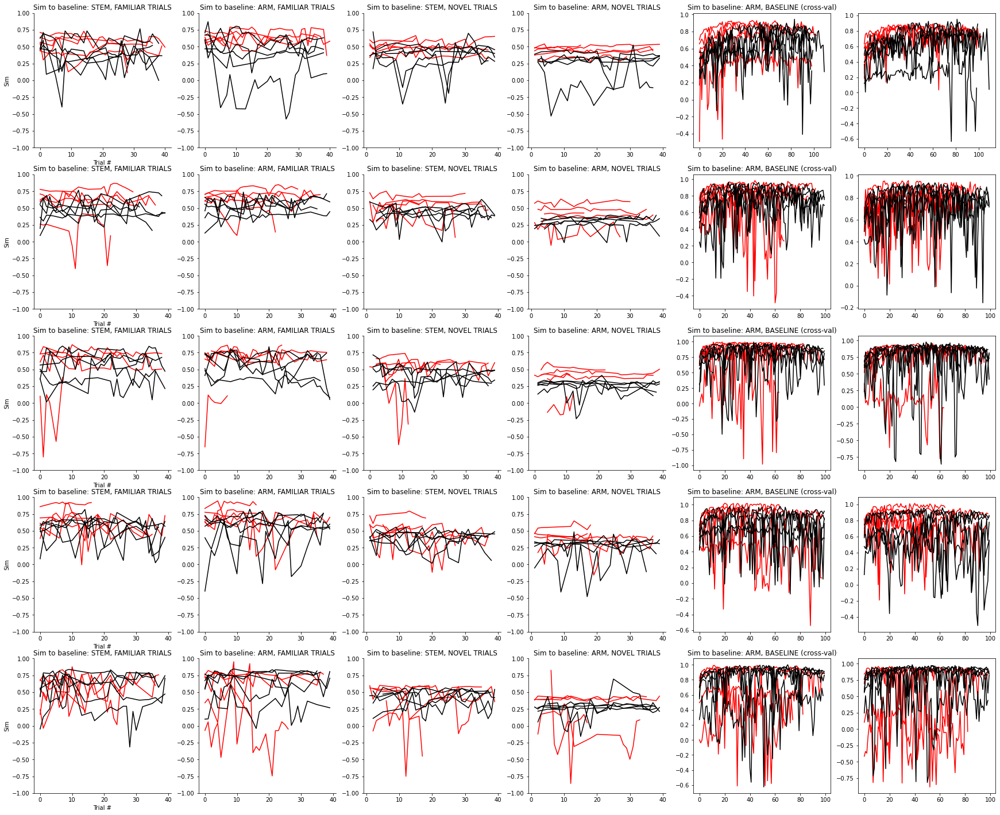

In [32]:
fig, ax = plt.subplots(5,6, figsize= [30, 25])

for day in range(5):
    ko_sess = ko_sessions[day]
    ctrl_sess = ctrl_sessions[day]



    ax[day, 0].set_ylabel('Sim')
    ax[day,0].set_xlabel('Trial #')

    ax[day,0].set_title('Sim to baseline: STEM, FAMILIAR TRIALS')
    ax[day,1].set_title('Sim to baseline: ARM, FAMILIAR TRIALS')

    ax[day,2].set_title('Sim to baseline: STEM, NOVEL TRIALS')
    ax[day,3].set_title('Sim to baseline: ARM, NOVEL TRIALS')
    
    ax[day,4].set_title('Sim to baseline: STEM, BASELINE (cross-val)')
    ax[day,4].set_title('Sim to baseline: ARM, BASELINE (cross-val)')
    for mouse, dat in ko_sess.items():
        print(mouse)
        ax[day,0].plot(dat['fam_trials'],dat['fam_sim'][0], color = 'red')
        ax[day,1].plot(dat['fam_trials'],dat['fam_sim'][1], color = 'red')
        ax[day,2].plot(dat['nov_trials'],dat['nov_sim'][0], color = 'red')
        ax[day,3].plot(dat['nov_trials'],dat['nov_sim'][1], color = 'red')
        ax[day, 4].plot(dat['baseline_stab'][0],color='red')
        ax[day, 5].plot(dat['baseline_stab'][1],color = 'red')


    for mouse, dat in ctrl_sess.items():
        print(mouse)
        ax[day,0].plot(dat['fam_trials'],dat['fam_sim'][0], color = 'black')
        ax[day,1].plot(dat['fam_trials'],dat['fam_sim'][1], color = 'black')
        ax[day,2].plot(dat['nov_trials'],dat['nov_sim'][0], color = 'black')
        ax[day,3].plot(dat['nov_trials'],dat['nov_sim'][1], color = 'black')
        ax[day, 4].plot(dat['baseline_stab'][0],color='black')
        ax[day, 5].plot(dat['baseline_stab'][1],color = 'black')

    for ind in range(4):
        ax[day,ind].set_ylim([-1,1])
        ax[day,ind].spines['top'].set_visible(False)
        ax[day,ind].spines['right'].set_visible(False)


    ko_novarmsim = np.array([np.median(dat['nov_sim'][1]) for mouse, dat in ko_sess.items()])
    ctrl_novarmsim = np.array([np.median(dat['nov_sim'][1]) for mouse, dat in ctrl_sess.items()])
    
    t,p = sp.stats.ranksums(ko_novarmsim,ctrl_novarmsim)
    print("day %d, p-val %f" % (day,p))

# fig, ax = plt.subplots()
# ax.scatter(np.zeros([5,]),ko_novarmsim,color='red')
# ax.scatter(np.ones([5,]), ctrl_novarmsim, color='black')



In [33]:
ko_avg_sessions = [{mouse:avg_sim_to_baseline_blocks(load_single_day(mouse,day=day)) for mouse in stx.ymaze_sess_deets.KO_sessions.keys()} for day in range(5)]
ctrl_avg_sessions = [{mouse:avg_sim_to_baseline_blocks(load_single_day(mouse,day=day)) for mouse in stx.ymaze_sess_deets.CTRL_sessions.keys()} for day in range(5)]

({'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1, 'ravel_ind': 0}, {'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 6, 'scan': 14, 'novel': -1, 'ravel_ind': 1})


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:95: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")


28_09_2020 YMaze_LNovel
28_09_2020 YMaze_LNovel
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
['LR', 'block_number', 'sess_num_ravel', 'sess_num']
LR
block_number
sess_num_ravel
sess_num
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 3, 'scan': 8, 'novel': 1, 'ravel_ind': 0}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': -1, 'ravel_ind': 0}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel': 1, 'ravel_ind': 0}
{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': -1, 'ravel_ind': 0}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1, 'ravel_ind': 2}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': 1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': -1, 'ravel_ind': 1}
{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': 1, 'ravel_ind

day 0, p-val 0.028280
day 1, p-val 0.075800
day 2, p-val 0.117185
day 3, p-val 0.250592
day 4, p-val 0.601508


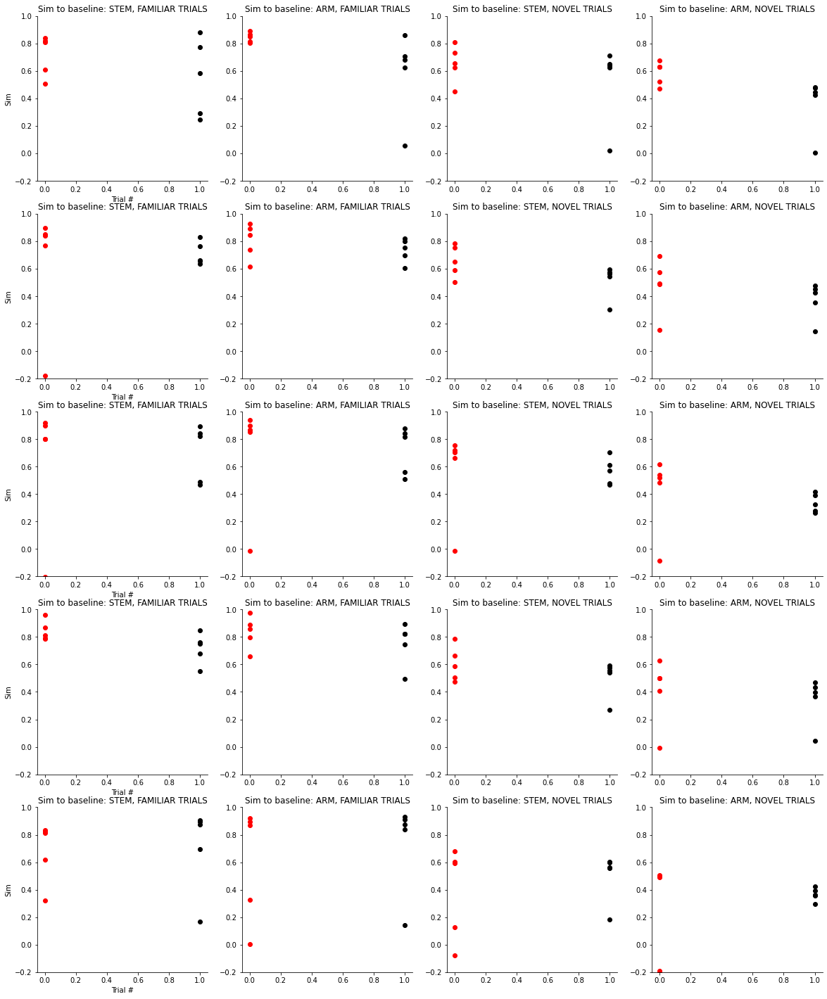

In [38]:
fig, ax = plt.subplots(5,4, figsize= [20, 25])

for day in range(5):
    ko_sess = ko_avg_sessions[day]
    ctrl_sess = ctrl_avg_sessions[day]



    ax[day, 0].set_ylabel('Sim')
    ax[day,0].set_xlabel('Trial #')

    ax[day,0].set_title('Sim to baseline: STEM, FAMILIAR TRIALS')
    ax[day,1].set_title('Sim to baseline: ARM, FAMILIAR TRIALS')

    ax[day,2].set_title('Sim to baseline: STEM, NOVEL TRIALS')
    ax[day,3].set_title('Sim to baseline: ARM, NOVEL TRIALS')
    
    
    
    zeros = np.zeros([5,])
    ones = np.ones([5,])
    
    
    
    ax[day,0].scatter(zeros,[dat['fam_sim'][0] for mouse,dat in ko_sess.items()], color = 'red')
    ax[day,1].scatter(zeros,[dat['fam_sim'][1] for mouse,dat in ko_sess.items()], color = 'red')
    ax[day,2].scatter(zeros,[dat['nov_sim'][0] for mouse,dat in ko_sess.items()], color = 'red')
    ax[day,3].scatter(zeros,[dat['nov_sim'][1] for mouse,dat in ko_sess.items()], color = 'red')
    
    ax[day,0].scatter(ones,[dat['fam_sim'][0] for mouse,dat in ctrl_sess.items()], color = 'black')
    ax[day,1].scatter(ones,[dat['fam_sim'][1] for mouse,dat in ctrl_sess.items()], color = 'black')
    ax[day,2].scatter(ones,[dat['nov_sim'][0] for mouse,dat in ctrl_sess.items()], color = 'black')
    ax[day,3].scatter(ones,[dat['nov_sim'][1] for mouse,dat in ctrl_sess.items()], color = 'black')
#         ax[day,1].plot(zeros,dat['fam_sim'][1], color = 'red')
#         ax[day,2].plot(zeros,dat['nov_sim'][0], color = 'red')
#         ax[day,3].plot(dat['nov_trials'],dat['nov_sim'][1], color = 'red')
        
#     for mouse, dat in ctrl_sess.items():
#         print(mouse)
#         ax[day,0].plot(dat['fam_trials'],dat['fam_sim'][0], color = 'black')
#         ax[day,1].plot(dat['fam_trials'],dat['fam_sim'][1], color = 'black')
#         ax[day,2].plot(dat['nov_trials'],dat['nov_sim'][0], color = 'black')
#         ax[day,3].plot(dat['nov_trials'],dat['nov_sim'][1], color = 'black')

    for ind in range(4):
        ax[day,ind].set_ylim([-.2,1])
        ax[day,ind].spines['top'].set_visible(False)
        ax[day,ind].spines['right'].set_visible(False)


#     ko_novarmsim = np.array([np.median(dat['nov_sim'][1]) for mouse, dat in ko_sess.items()])
#     ctrl_novarmsim = np.array([np.median(dat['nov_sim'][1]) for mouse, dat in ctrl_sess.items()])
    
    t,p = sp.stats.ranksums([dat['nov_sim'][1] for mouse,dat in ko_sess.items()],[dat['nov_sim'][1] for mouse,dat in ctrl_sess.items()])
    print("day %d, p-val %f" % (day,p))

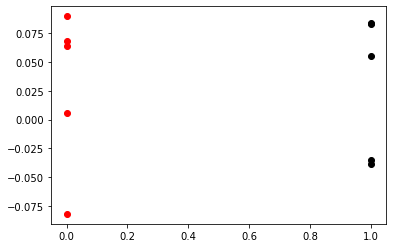

In [214]:
ko_arm_simdiff = []
for mouse, dat in ko_first_sess.items():
    ko_arm_simdiff.append(dat['fam_sim'][0].mean()-dat['nov_sim'][0].mean())

ctrl_arm_simdiff = []
for mouse, dat in ctrl_first_sess.items():
    ctrl_arm_simdiff.append(dat['fam_sim'][0].mean()-dat['nov_sim'][0].mean())

fig, ax = plt.subplots()
ax.scatter(np.zeros([5,]),ko_arm_simdiff,color='red')

ax.scatter(np.ones([5,]), ctrl_arm_simdiff, color='black')

[13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43]
{'xcenter': 31.6, 'zcenter': 181.6, 'scale': 25, 'zfront': 177.968, 'zback': 202.968, 'tfront': array(32.67690446), 'tback': array(35.90278601), 't_antic': 27.67690445738824, 'z_antic': array(140.57648984)}
[False False False False False False False False False False False False
 False False False  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True]
15 15 (30,)


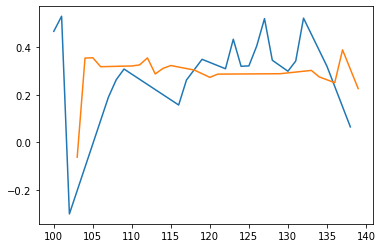

In [36]:
concat_sess.place_cell_info['left']['masks'].shape

(11, 444)

In [56]:
novel_mask = concat_sess.trial_info['LR']==concat_sess.novel_arm

print(concat_sess.scene)
# pre_reversal_mask 
# fam_trials = 


['YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_LNovel', 'YMaze_RewardReversal', 'YMaze_RewardReversal', 'YMaze_RewardReversal', 'YMaze_LNovel']


NameError: name 'trial_matrix' is not defined

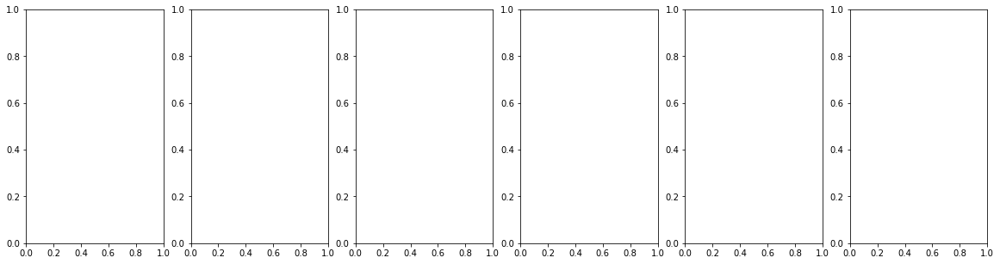

In [12]:
for i in range(1): #trial_matrix.shape[-1]):
    fig,ax = plt.subplots(1,6,figsize=[20,5])
    left_trials = trial_matrix[LR==-1,:,i]
    left_trials[np.isnan(left_trials)]=0
    left_trials[np.isinf(left_trials)]=0
    left_trials = sp.ndimage.gaussian_filter1d(left_trials/(np.nanmean(left_trials)+1E-3),1, axis=1)
    
    right_trials = trial_matrix[LR==1,:,i]
    right_trials[np.isnan(right_trials)]=0
    right_trials[np.isinf(right_trials)]=0
    right_trials = sp.ndimage.gaussian_filter1d(right_trials/(np.nanmean(right_trials)+1E-3),1, axis=1)
    
    ax[0].imshow(left_trials,aspect='auto',vmax=5, vmin=0, cmap='magma')
    ax[0].set_title('Left Trials')
    ax[0].set_ylabel('trial #')
    ax[0].set_xlabel('Position (spline param)')
    ax[1].imshow(right_trials,aspect='auto',vmax=5, vmin=0, cmap='magma')
    ax[1].set_title('Right Trials')
    ax[1].set_ylabel('trial #')
    ax[1].set_ylabel('trial #')
    ax[1].set_xlabel('Position (spline param)')
    
    
    ref_com = [sess_list[0].s2p_stats[common_roi_mapping[0,i]]['ypix'].mean(),sess_list[0].s2p_stats[common_roi_mapping[0,i]]['xpix'].mean()]
    
    ybounds = [int(max(0,ref_com[0]-50)), int(min(512,ref_com[0]+50))]
    xbounds = [int(max(0,ref_com[1]-50)), int(min(796,ref_com[1]+50))]
    center = (ref_com[0]-ybounds[0],ref_com[1] - xbounds[0])
    
    ax[2].imshow(sess_list[0].s2p_ops['meanImg'][ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],cmap='Greys_r')
    roi = np.zeros([512,796])*np.nan
    roi[sess_list[0].s2p_stats[common_roi_mapping[0,i]]['ypix'], sess_list[0].s2p_stats[common_roi_mapping[0,i]]['xpix']]=1
    ax[2].imshow(roi[ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],alpha=.5)
    ax[2].set_title('GCaMP')
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    
    
    ax[3].imshow(sess_list[0].s2p_ops['meanImg'][ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],cmap='Greys_r')
    circle = plt.Circle(center,12, fill=False,color='cyan')
    ax[3].add_artist(circle)
    ax[3].set_xticks([])
    ax[3].set_yticks([])

    ax[4].imshow(sess_list[0].s2p_ops['meanImg_chan2'][ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],cmap='Greys_r')
    ax[4].imshow(roi[ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],alpha=.5)
    ax[4].set_title('mCherry')
    ax[4].set_xticks([])
    ax[4].set_yticks([])
    
    ax[5].imshow(sess_list[0].s2p_ops['meanImg_chan2'][ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],cmap='Greys_r')
    circle = plt.Circle(center,12, fill=False,color='cyan')
    ax[5].add_artist(circle)
    ax[5].set_xticks([])
    ax[5].set_yticks([])
    
    fig.subplots_adjust(wspace = .5)
    
    figdir = os.path.join("/home/mplitt/Fig_scratch/YMaze/tracked_cells",mouse)
    os.makedirs(figdir,exist_ok=True)
    fig.savefig(os.path.join(figdir, "cell_%d.pdf" % i),format='pdf')
    
#     fig,ax = plt.subplots(1,6,figsize=[20,5])

In [14]:
for sess in sess_list:
    print(sess.date)

28_09_2020
29_09_2020
30_09_2020
01_10_2020
02_10_2020
03_10_2020
04_10_2020
04_10_2020
05_10_2020
06_10_2020
06_10_2020


In [15]:
sess = sess_list[1]


In [16]:

right_matrix = sess.trial_matrices['F_dff'][sess.trial_info['LR']==1,:,:]
left_matrix = sess.trial_matrices['F_dff'][sess.trial_info['LR']==-1,:,:]


print(right_matrix.shape,left_matrix.shape)

(15, 30, 527) (109, 30, 527)


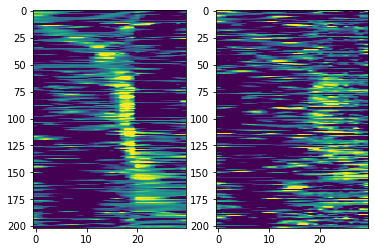

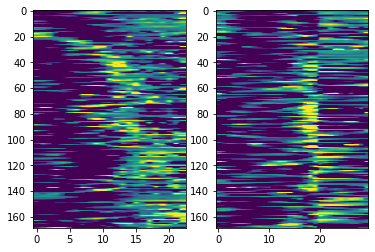

In [17]:

left_sort = np.argsort(np.argmax(np.nanmean(left_matrix[::2,:,sess.place_cell_info['left']['masks']],axis=0),axis=0))
left_plot = np.nanmean(left_matrix[1::2,:,sess.place_cell_info['left']['masks']],axis=0)
left_plot = left_plot[:,left_sort]
left_plot = sp.stats.zscore(left_plot,axis=0)

right_plot = np.nanmean(right_matrix[:,:,sess.place_cell_info['left']['masks']],axis=0)
right_plot = right_plot[:,left_sort]
right_plot = sp.stats.zscore(right_plot,axis=0)
fig,ax = plt.subplots(1,2)
ax[0].imshow(left_plot.T,aspect='auto',vmin=0,vmax=1.5)
ax[1].imshow(right_plot.T,aspect='auto',vmin=0,vmax=1.5)


right_sort = np.argsort(np.argmax(np.nanmean(right_matrix[::2,:,sess.place_cell_info['right']['masks']],axis=0),axis=0))
right_plot = np.nanmean(right_matrix[1::2,7:,sess.place_cell_info['right']['masks']],axis=0)
right_plot = right_plot[:,right_sort]
right_plot = sp.stats.zscore(right_plot,axis=0)


left_plot = np.nanmean(left_matrix[:,:,sess.place_cell_info['right']['masks']],axis=0)
left_plot = left_plot[:,right_sort]
left_plot = sp.stats.zscore(left_plot,axis=0)
fig,ax = plt.subplots(1,2)
ax[0].imshow(right_plot.T,aspect='auto',vmin=0,vmax=1.5)
ax[1].imshow(left_plot.T,aspect='auto',vmin=0,vmax=1.5)